In [1]:
import scipy.stats as stats
from sklearn.metrics import silhouette_score
from sklearn.compose import ColumnTransformer
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture  # Import GaussianMixture
from datetime import datetime
# Set display options to show all columns and rows
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
data = pd.read_csv(r"C:\Users\ashka\OneDrive\Documents\DA 205 Segmentation\final version.csv")
data.head()

,user_id,age,gender,married,has_children,total_sessions,total_page_clicks,avg_page_clicks_per_session,mean_session_time,total_flights_booked,total_hotels_booked,total_cancellations,avg_flight_discount,avg_hotel_discount,total_checked_bags,percentage_flights_with_checked_bags,avg_base_fare_usd,avg_hotel_per_room_usd,scaled_ads_per_km,discount_flight_proportion,last_session_time
0,23557,64,F,1,0,8,82,10.250,76.625000,0,2,0,0.000,0.250,NaN,0.0,NaN,177.0,NaN,0.00,2023-07-14 12:36:00
1,94883,51,F,1,0,8,73,9.125,67.750000,2,2,0,0.000,0.125,1.0,50.0,432.045,90.0,NaN,0.00,2023-05-28 17:28:00
2,101486,50,F,1,1,8,131,16.375,122.250000,1,2,0,0.250,0.000,0.0,0.0,189.910,198.5,NaN,0.25,2023-07-18 09:35:00
3,101961,42,F,1,0,8,126,15.750,117.750000,5,5,0,0.250,0.125,2.0,40.0,248.532,136.0,0.004792,0.25,2023-06-22 13:27:00
4,106907,44,F,1,1,8,240,30.000,758.915066,2,2,1,0.125,0.125,10.0,500.0,13902.060,129.0,NaN,0.00,2023-07-27 09:43:48


In [3]:
# Identify and remove outliers using Z-Score
z_scores = np.abs(stats.zscore(data.select_dtypes(include=[np.number])))
threshold = 3
outliers = np.where(z_scores > threshold)

# Remove rows containing outliers
data_no_outliers = data.drop(index=outliers[0])

In [4]:
# Continue with data preprocessing
data_no_outliers['total_checked_bags'].fillna(1.0, inplace=True)
data_no_outliers['percentage_flights_with_checked_bags'].fillna(50.0, inplace=True)
data_no_outliers['avg_base_fare_usd'].fillna(391.92, inplace=True)
data_no_outliers['avg_hotel_per_room_usd'].fillna(163.0, inplace=True)
data_no_outliers['scaled_ads_per_km'].fillna(0.008667, inplace=True)
data_no_outliers['bargain_hunter_index'] = (
    data_no_outliers['scaled_ads_per_km'] * 
    data_no_outliers['discount_flight_proportion'] * 
    data_no_outliers['avg_flight_discount']
)

In [5]:
# Display the updated information about missing values after filling
missing_values_after_filling = data_no_outliers.isnull().sum()
print("Missing Values After Filling:")
print(missing_values_after_filling)

Missing Values After Filling:
user_id                                 0
age                                     0
gender                                  0
married                                 0
has_children                            0
total_sessions                          0
total_page_clicks                       0
avg_page_clicks_per_session             0
mean_session_time                       0
total_flights_booked                    0
total_hotels_booked                     0
total_cancellations                     0
avg_flight_discount                     0
avg_hotel_discount                      0
total_checked_bags                      0
percentage_flights_with_checked_bags    0
avg_base_fare_usd                       0
avg_hotel_per_room_usd                  0
scaled_ads_per_km                       0
discount_flight_proportion              0
last_session_time                       0
bargain_hunter_index                    0
dtype: int64


In [6]:
data_no_outliers.bargain_hunter_index.describe()

count    5367.000000
mean        0.002343
std         0.007592
min         0.000000
25%         0.000107
50%         0.000238
75%         0.001219
max         0.239537
Name: bargain_hunter_index, dtype: float64

With the above steps, data was copied, NaN values were dealt with, and a new metric was added. This new metric has a direct relation with scaled average dollars saved per kilometre and the cube of average flight discount. It won't come as a surprise if it shows a high correlation with said metrics, and since it is already scaled, it stands to reason to omit it from the scaling process that follows.

C:\Users\ashka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


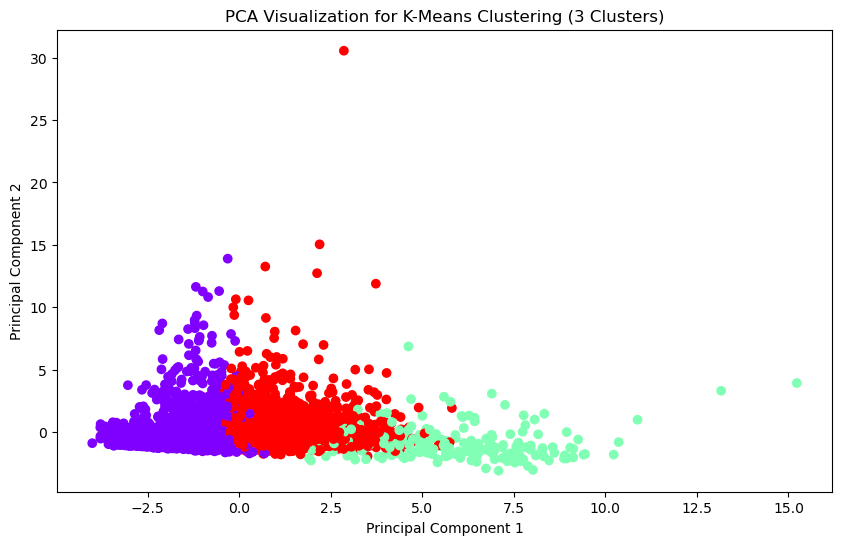

C:\Users\ashka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


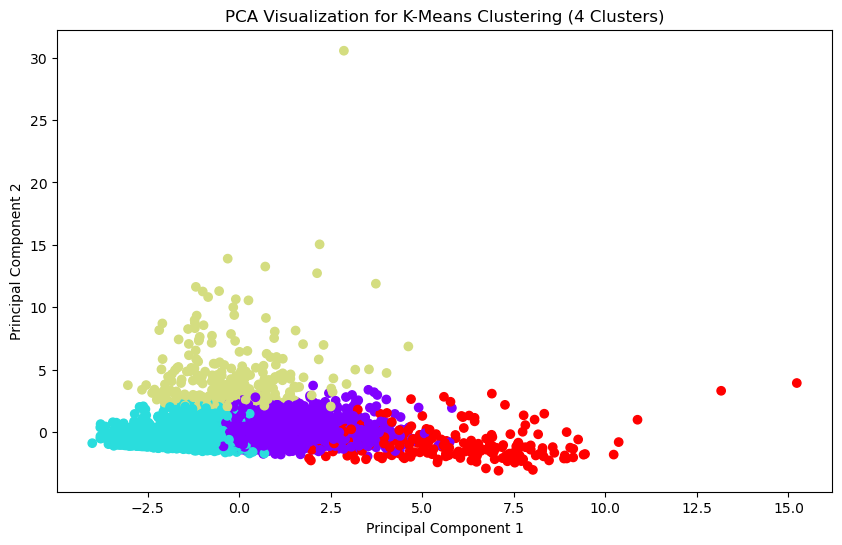

C:\Users\ashka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


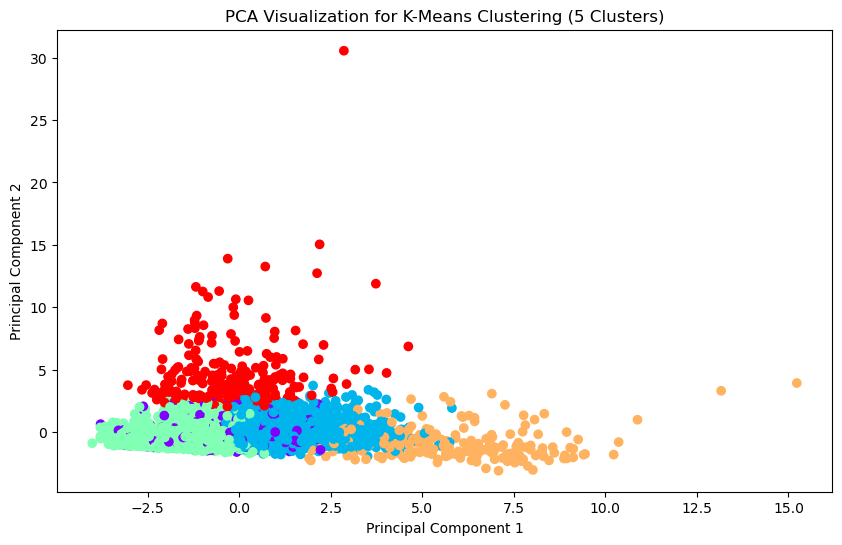

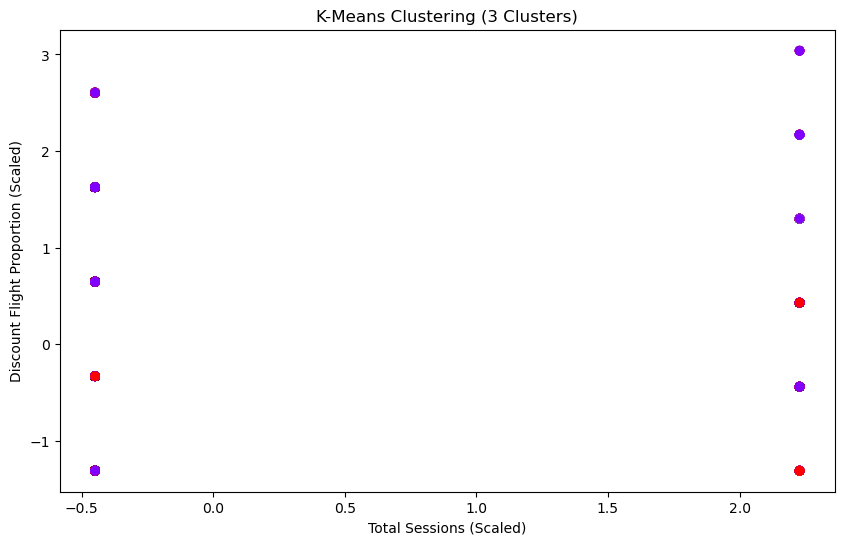

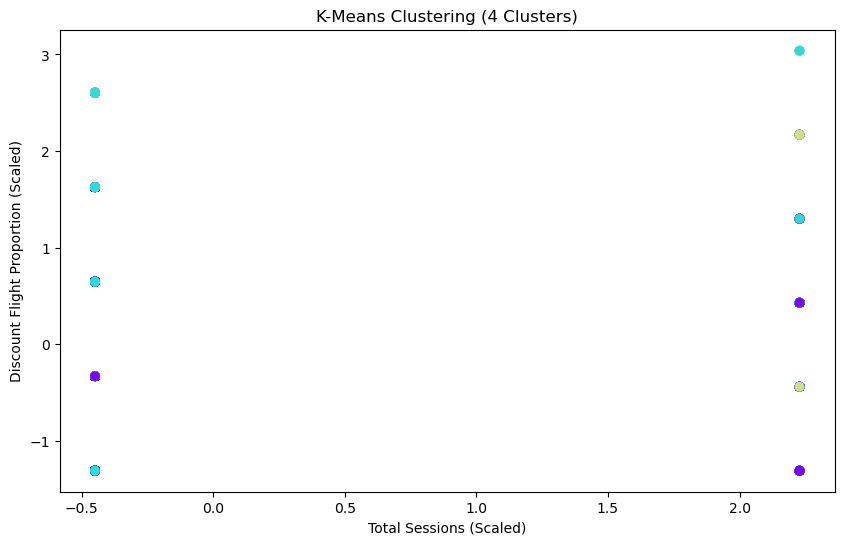

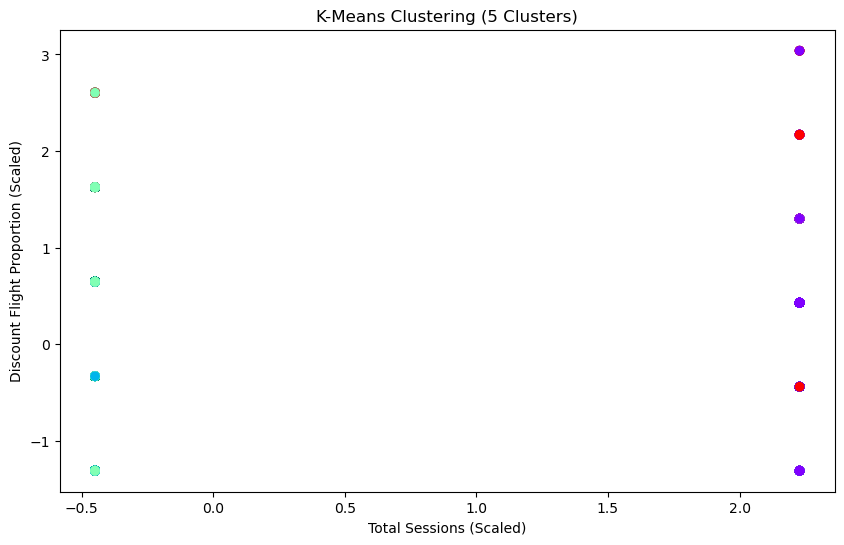

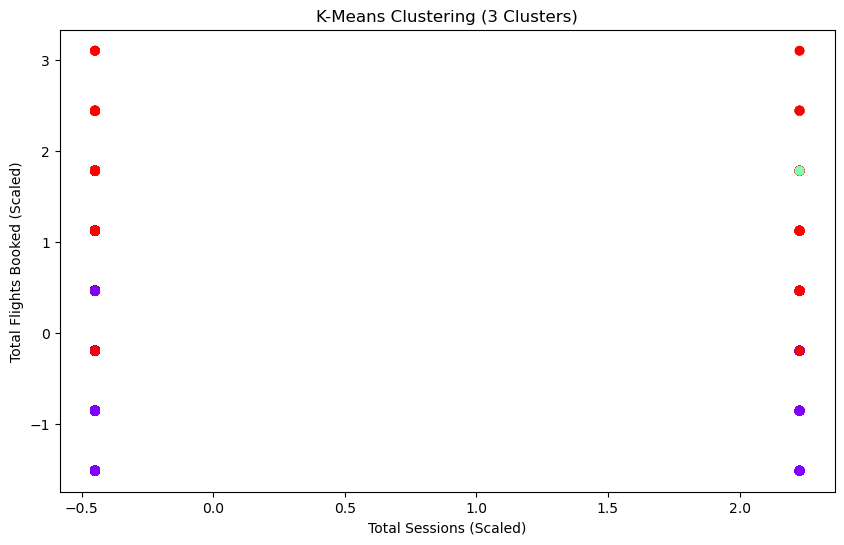

...

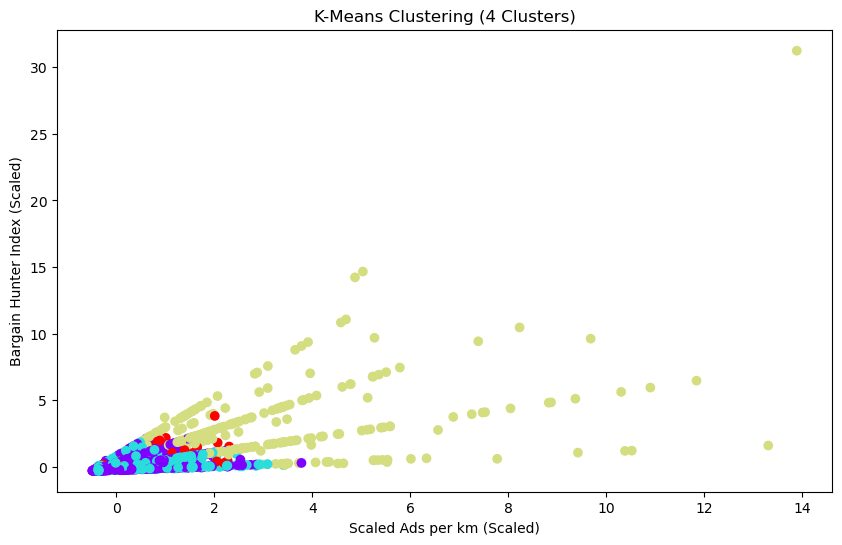

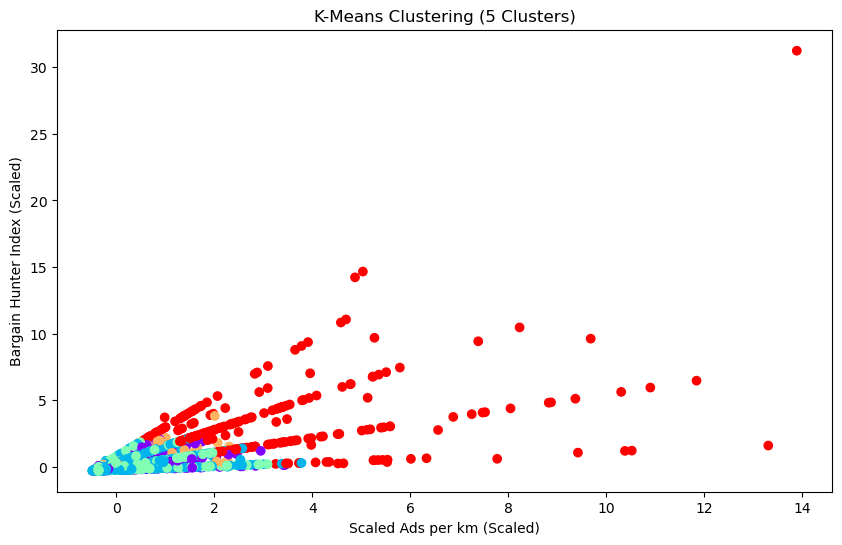

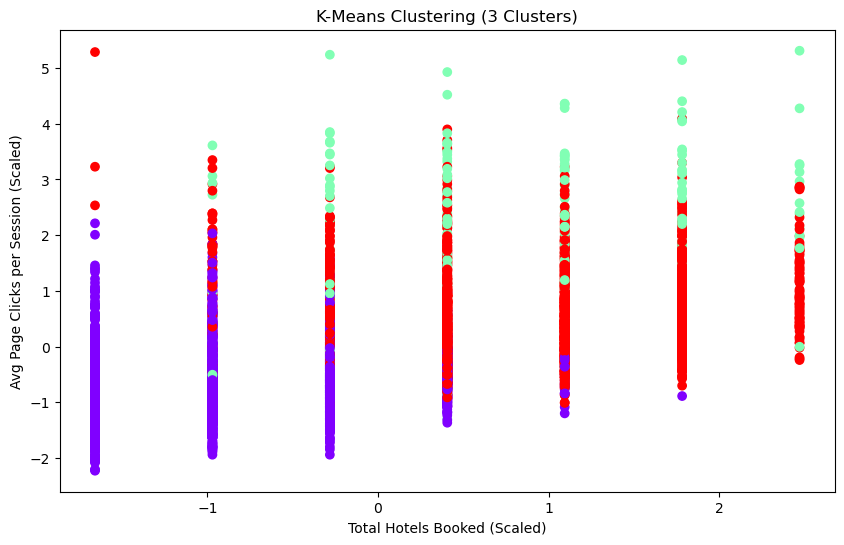

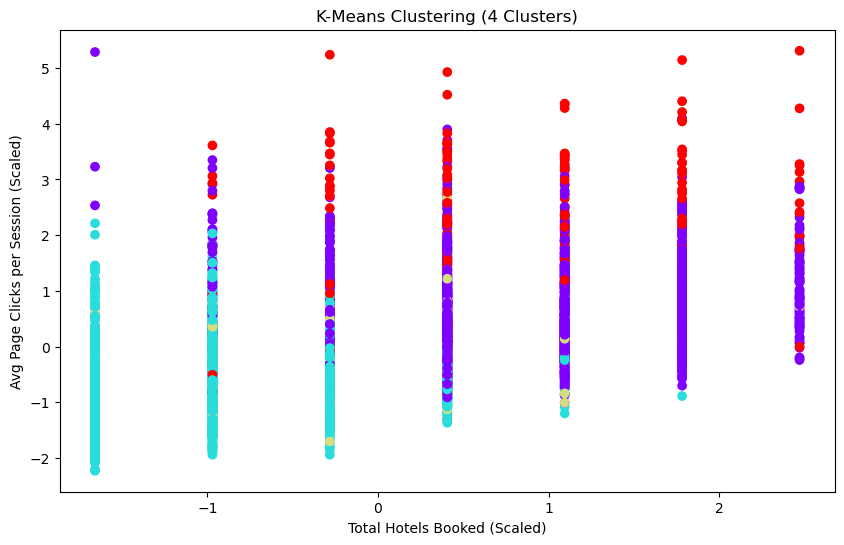

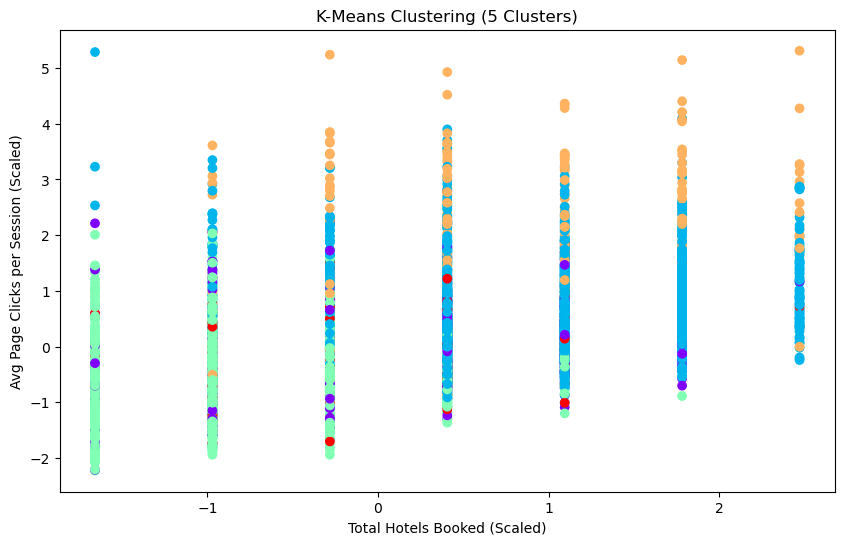

In [7]:
# Perform one-hot encoding for the 'gender' column
gender_encoded = pd.get_dummies(data_no_outliers['gender'], prefix='gender', drop_first=True)
# Select the relevant columns for scaling
columns_to_scale = ['age', 'total_sessions', 'total_page_clicks', 'avg_page_clicks_per_session',
                    'discount_flight_proportion', 'mean_session_time', 'total_flights_booked',
                    'total_hotels_booked', 'total_cancellations',
                    'avg_hotel_discount', 'total_checked_bags', 'percentage_flights_with_checked_bags',
                    'avg_base_fare_usd', 'avg_hotel_per_room_usd', 'scaled_ads_per_km',
                    'bargain_hunter_index']

# Select relevant features for clustering
selected_features = columns_to_scale
scaler = StandardScaler()
X_scaled = scaler.fit_transform(data_no_outliers[selected_features])

# Perform K-Means clustering for 3, 4, and 5 clusters
num_clusters = [3, 4, 5]
cluster_results = {}

for n_clusters in num_clusters:
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    clusters = kmeans.fit_predict(X_scaled)
    cluster_results[n_clusters] = clusters

    # Perform PCA for visualization
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X_scaled)

    # Visualize the PCA clusters
    plt.figure(figsize=(10, 6))
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=clusters, cmap='rainbow')
    plt.title(f'PCA Visualization for K-Means Clustering ({n_clusters} Clusters)')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.show()

# Visualize the clusters
for n_clusters, clusters in cluster_results.items():
    plt.figure(figsize=(10, 6))
    plt.scatter(X_scaled[:, selected_features.index('total_sessions')], X_scaled[:, selected_features.index('discount_flight_proportion')], c=clusters, cmap='rainbow')
    plt.title(f'K-Means Clustering ({n_clusters} Clusters)')
    plt.xlabel('Total Sessions (Scaled)')
    plt.ylabel('Discount Flight Proportion (Scaled)')
    plt.show()

# Visualize the clusters
for n_clusters, clusters in cluster_results.items():
    plt.figure(figsize=(10, 6))
    plt.scatter(X_scaled[:, selected_features.index('total_sessions')], X_scaled[:, selected_features.index('total_flights_booked')], c=clusters, cmap='rainbow')
    plt.title(f'K-Means Clustering ({n_clusters} Clusters)')
    plt.xlabel('Total Sessions (Scaled)')
    plt.ylabel('Total Flights Booked (Scaled)')
    plt.show()

# Visualize the clusters
for n_clusters, clusters in cluster_results.items():
    plt.figure(figsize=(10, 6))
    plt.scatter(X_scaled[:, selected_features.index('total_sessions')], X_scaled[:, selected_features.index('bargain_hunter_index')], c=clusters, cmap='rainbow')
    plt.title(f'K-Means Clustering ({n_clusters} Clusters)')
    plt.xlabel('Total Sessions (Scaled)')
    plt.ylabel('Bargain Hunter Index (Scaled)')
    plt.show()

# Visualize the clusters
for n_clusters, clusters in cluster_results.items():
    plt.figure(figsize=(10, 6))
    plt.scatter(X_scaled[:, selected_features.index('scaled_ads_per_km')], X_scaled[:, selected_features.index('bargain_hunter_index')], c=clusters, cmap='rainbow')
    plt.title(f'K-Means Clustering ({n_clusters} Clusters)')
    plt.xlabel('Scaled Ads per km (Scaled)')
    plt.ylabel('Bargain Hunter Index (Scaled)')
    plt.show()

# Visualize the clusters
for n_clusters, clusters in cluster_results.items():
    plt.figure(figsize=(10, 6))
    plt.scatter(X_scaled[:, selected_features.index('total_hotels_booked')], X_scaled[:, selected_features.index('avg_page_clicks_per_session')], c=clusters, cmap='rainbow')
    plt.title(f'K-Means Clustering ({n_clusters} Clusters)')
    plt.xlabel('Total Hotels Booked (Scaled)')
    plt.ylabel('Avg Page Clicks per Session (Scaled)')
    plt.show()


It is crucial to test different clustering numbers. Given the context of the project and the domain knowledge shared by the designers, I am trying to see whether I could fit 5 segments. As can be seen from the graphs above with 5 segments we get a lot of overlap, in other words, clusters are not easily discernible. So, I am going to check the distributions prior to and after scaling, and in all likelihood, will have to give other clustering algorithms a try as well.

Original Data Statistics:
             user_id          age      married  has_children  total_sessions  \
count    5367.000000  5367.000000  5367.000000   5367.000000     5367.000000   
mean   548220.403950    40.803242     0.438979      0.326998        8.167691   
std     52013.672772    11.852430     0.496309      0.469160        0.373627   
min    353271.000000    16.000000     0.000000      0.000000        8.000000   
25%    518215.000000    34.000000     0.000000      0.000000        8.000000   
50%    541040.000000    41.000000     0.000000      0.000000        8.000000   
75%    574037.000000    48.000000     1.000000      1.000000        8.000000   
max    739734.000000    77.000000     1.000000      1.000000        9.000000   

       total_page_clicks  avg_page_clicks_per_session  mean_session_time  \
count        5367.000000                  5367.000000        5367.000000   
mean          129.833985                    15.893907         131.852378   
std            43.272794 

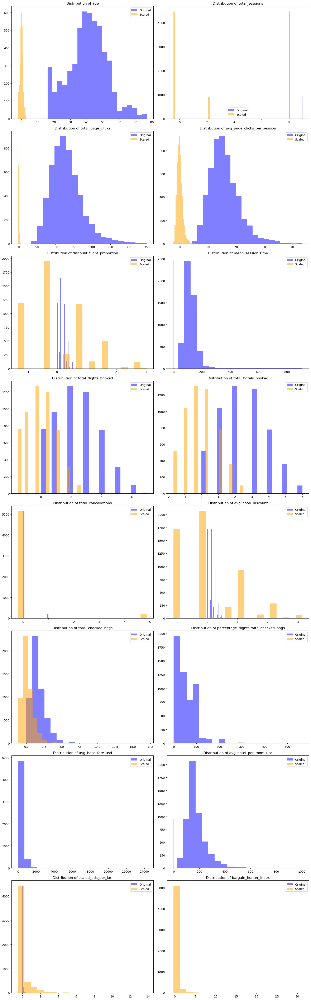

In [8]:
# Calculate basic statistics for both original and scaled data
original_stats = data_no_outliers.describe()  # Use data_no_outliers instead of data
scaled_stats = pd.DataFrame(X_scaled, columns=selected_features).describe()

# Print basic statistics for comparison
print("Original Data Statistics:")
print(original_stats)
print("\nScaled Data Statistics:")
print(scaled_stats)

# Calculate the number of rows and columns for subplots
num_features = len(selected_features)
num_cols = 2
num_rows = (num_features + 1) // num_cols  # +1 to account for uneven division

# Create subplots for comparing original and scaled data columns
fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 6 * num_rows))

for i, col in enumerate(selected_features):
    row = i // num_cols
    col_idx = i % num_cols
    
    axs[row, col_idx].hist(data_no_outliers[col], bins=20, alpha=0.5, color='blue', label='Original')
    axs[row, col_idx].hist(X_scaled[:, i], bins=20, alpha=0.5, color='orange', label='Scaled')
    axs[row, col_idx].set_title(f'Distribution of {col}')
    axs[row, col_idx].legend()

# Adjust layout
plt.tight_layout()
plt.show()

In [9]:
clustering_algorithms = [
    ('KMeans', KMeans(n_clusters=4, random_state=0)),
    ('Agglomerative', AgglomerativeClustering(n_clusters=4)),
    ('DBSCAN', DBSCAN(eps=0.5, min_samples=5)),
    ('GMM', GaussianMixture(n_components=4, random_state=0))
]

# Drop the 'gender' column from your data_no_outliers DataFrame
data_no_outliers_without_gender = data_no_outliers.drop(columns=['gender','last_session_time'])

# Assign data_no_outliers_scaled back to X_no_outliers_scaled
X_no_outliers_scaled = X_scaled

for data_label, data_matrix in [('Original', data_no_outliers_without_gender), ('Scaled', X_scaled)]:
    print(f'Clustering Results for {data_label} Data:')
    
    for name, algorithm in clustering_algorithms:
        clusters = algorithm.fit_predict(data_matrix)
        
        unique_labels, label_counts = np.unique(clusters, return_counts=True)
        valid_labels = unique_labels[label_counts > 1]
        
        if len(valid_labels) > 1:
            silhouette_avg = silhouette_score(data_matrix, clusters)
            print(f'{name} Silhouette Score: {silhouette_avg}')
        else:
            print(f'{name} has only singleton clusters, skipping silhouette score')
    
    print()

Clustering Results for Original Data:


C:\Users\ashka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans Silhouette Score: 0.5687001051948909
Agglomerative Silhouette Score: 0.5308504993009268
DBSCAN has only singleton clusters, skipping silhouette score
GMM Silhouette Score: -0.07924598372478868

Clustering Results for Scaled Data:


C:\Users\ashka\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans Silhouette Score: 0.17261011433729506
Agglomerative Silhouette Score: 0.12752577253669756
DBSCAN Silhouette Score: -0.109241939842595
GMM Silhouette Score: 0.06683378151479459



KMeans provide the best results in this case.

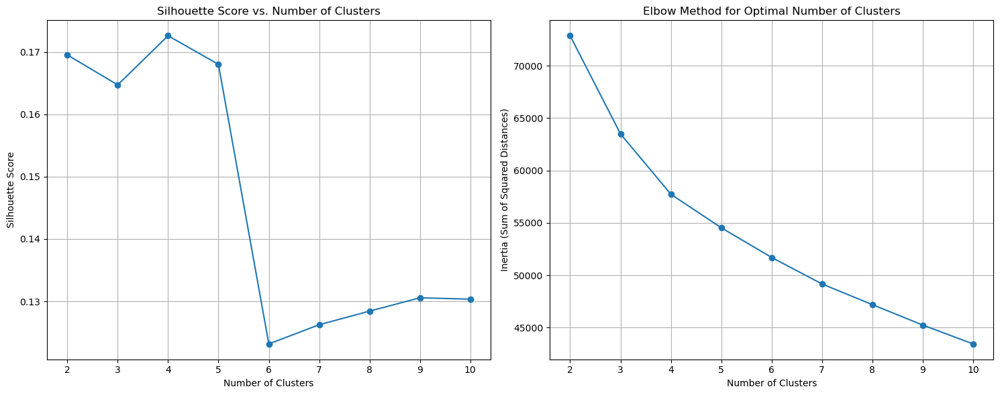

Silhouette Scores:
Number of Clusters: 2
Silhouette Score: 0.16953087020670138

Number of Clusters: 3
Silhouette Score: 0.16472306513433368

Number of Clusters: 4
Silhouette Score: 0.17261011433729506

Number of Clusters: 5
Silhouette Score: 0.16801357317551024

Number of Clusters: 6
Silhouette Score: 0.12316257240878588

Number of Clusters: 7
Silhouette Score: 0.12624196331971113

Number of Clusters: 8
Silhouette Score: 0.1284216609415559

Number of Clusters: 9
Silhouette Score: 0.13056363893004172

Number of Clusters: 10
Silhouette Score: 0.13034496293001877

Inertia Scores:
Number of Clusters: 2
Inertia Score: 72870.55119970643

Number of Clusters: 3
Inertia Score: 63492.983454156834

Number of Clusters: 4
Inertia Score: 57736.17451470623

Number of Clusters: 5
Inertia Score: 54534.69839112884

Number of Clusters: 6
Inertia Score: 51701.51181465805

Number of Clusters: 7
Inertia Score: 49167.70163701408

Number of Clusters: 8
Inertia Score: 47194.11101540949

Number of Clusters: 9
I

In [10]:
# Select the range of cluster numbers to try
num_clusters_range = range(2, 11)

# Initialize lists to store silhouette scores and inertia scores
silhouette_scores = []
inertia_scores = []
kmeans_models = []

# Loop through the range of cluster numbers and fit KMeans models
for num_clusters in num_clusters_range:
    kmeans = KMeans(n_clusters=num_clusters, n_init=10, random_state=0)
    clusters = kmeans.fit_predict(X_no_outliers_scaled)  # Use X_no_outliers_scaled
    kmeans_models.append(kmeans)
    
    # Calculate the silhouette score for the current model
    silhouette_avg = silhouette_score(X_no_outliers_scaled, clusters)  # Use X_no_outliers_scaled
    silhouette_scores.append(silhouette_avg)
    
    # Calculate the inertia score for the current model
    kmeans.fit(X_no_outliers_scaled)
    inertia_scores.append(kmeans.inertia_)

# Plot Silhouette Score and Elbow Method graphs side by side
plt.figure(figsize=(15, 6))

# Silhouette Score graph
plt.subplot(1, 2, 1)
plt.plot(num_clusters_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs. Number of Clusters')
plt.grid()

# Elbow Method graph
plt.subplot(1, 2, 2)
plt.plot(num_clusters_range, inertia_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Sum of Squared Distances)')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.grid()

plt.tight_layout()
plt.show()

# Print silhouette and inertia scores for each cluster number
print("Silhouette Scores:")
for i, num_clusters in enumerate(num_clusters_range):
    print(f"Number of Clusters: {num_clusters}")
    print(f"Silhouette Score: {silhouette_scores[i]}\n")

print("Inertia Scores:")
for i, num_clusters in enumerate(num_clusters_range):
    print(f"Number of Clusters: {num_clusters}")
    print(f"Inertia Score: {inertia_scores[i]}\n")


In [11]:
# Perform KMeans clustering with 5 clusters
kmeans = KMeans(n_clusters=5, n_init=10, random_state=0)  # Change n_clusters to 5

# Fit KMeans to the data and obtain cluster labels for X_no_outliers_scaled
cluster_labels_no_outliers = kmeans.fit_predict(X_no_outliers_scaled)

# Add the cluster column to data_no_outliers
data_no_outliers['cluster'] = cluster_labels_no_outliers

# Print statistics for each cluster
cluster_statistics_no_outliers = data_no_outliers.groupby('cluster').describe()

# Print the statistics for each cluster
print(cluster_statistics_no_outliers)


        user_id                                                             \
          count           mean           std       min       25%       50%   
cluster                                                                      
0         713.0  544672.935484  46009.689057  361759.0  517543.0  535341.0   
1        1920.0  544934.100521  49044.491402  354050.0  517648.0  538368.5   
2        2291.0  552389.666958  55593.966950  353271.0  519226.5  545264.0   
3         206.0  546142.990291  54462.840696  363535.0  517460.0  543751.5   
4         237.0  547018.772152  51980.510008  373489.0  516590.0  541516.0   

                                 age                                          \
               75%       max   count       mean        std   min   25%   50%   
cluster                                                                        
0        565915.00  716337.0   713.0  42.381487  12.509223  16.0  35.0  43.0   
1        570381.25  734565.0  1920.0  42.852604   7.932

In [12]:
# Create a dictionary to map cluster numbers to their corresponding segment names
cluster_names = {
    0: "Refined Globetrotters",
    1: "Thoughtful Adventurers",
    2: "Energetic Enthusiasts",
    3: "Dynamic Explorers",
    4: "Budget-Conscious Explorers"
}

# Map cluster numbers to segment names and create a new 'segment' column in the DataFrame
data_no_outliers['segment'] = data_no_outliers['cluster'].map(cluster_names)

Cluster Analysis Report - Customer Segmentation and Perks

In this analysis, we've applied KMeans clustering to categorize customers based on their travel behavior and characteristics. Five distinct clusters have emerged, each with its own unique profile and preferences. To optimize customer engagement and satisfaction, we've designed tailored perks for each cluster, considering their preferences and behaviors:

1. Refined Globetrotters

Cluster Size: 713 Customers
Description: Frequent travelers who value premium experiences.
Demographics: Average age of 42, with a preference for refinement.
Perks:
"One-night free hotel stay with flight": Appeals to their desire for exclusive and luxurious offerings.
"Exclusive discounts": Aligns with their willingness to invest in quality.
Travel Metrics:
Average Sessions: 9
Average Clicks: 129
Average Page Clicks per Session: 14.41
Average Mean Session Time: 107.47 seconds

2. Thoughtful Adventurers

Cluster Size: 1920 Customers
Description: Diverse age group that values thoughtful planning and budget-conscious travel.
Demographics: Average age of 43, balancing exploration with budget considerations.
Perks:
"Exclusive discounts": Appeals to their consideration of deals.
"Free checked bags": Enhances convenience-focused travel.
Travel Metrics:
Average Sessions: 8.05
Average Clicks: 152.85
Average Page Clicks per Session: 18.97
Average Mean Session Time: 141.22 seconds

3. Energetic Enthusiasts

Cluster Size: 2291 Customers
Description: Families seeking energetic and family-friendly vacation options.
Demographics: Average age of 39, looking for hassle-free family trips.
Perks:
"Free hotel meal": Appeals to their desire for family convenience.
"No cancellation fee": Provides flexibility for accommodating family plans.
Travel Metrics:
Average Sessions: 8
Average Clicks: 103.45
Average Page Clicks per Session: 12.93
Average Mean Session Time: 96.63 seconds

4. Dynamic Explorers

Cluster Size: 206 Customers
Description: Middle-aged travelers with a penchant for high-spending.
Demographics: Average age of 38, willing to spend on premium experiences.
Perks:
"Exclusive discounts": Resonates with their desire for quality offerings.
"Free hotel meal": Adds value to their premium travel.
Travel Metrics:
Average Sessions: 8.28
Average Clicks: 219.10
Average Page Clicks per Session: 26.42
Average Mean Session Time: 544.19 seconds

5. Budget-Conscious Explorers

Cluster Size: 237 Customers
Description: Value-conscious travelers prioritizing budget-friendly options.
Demographics: Average age of 40, focusing on affordability and practicality.
Perks:
"Free checked bags": Aligns with budget considerations.
"No cancellation fee": Offers flexibility without additional costs.
Travel Metrics:
Average Sessions: 8.12
Average Clicks: 121.28
Average Page Clicks per Session: 14.94
Average Mean Session Time: 111.55 seconds

<Figure size 1500x1500 with 0 Axes>

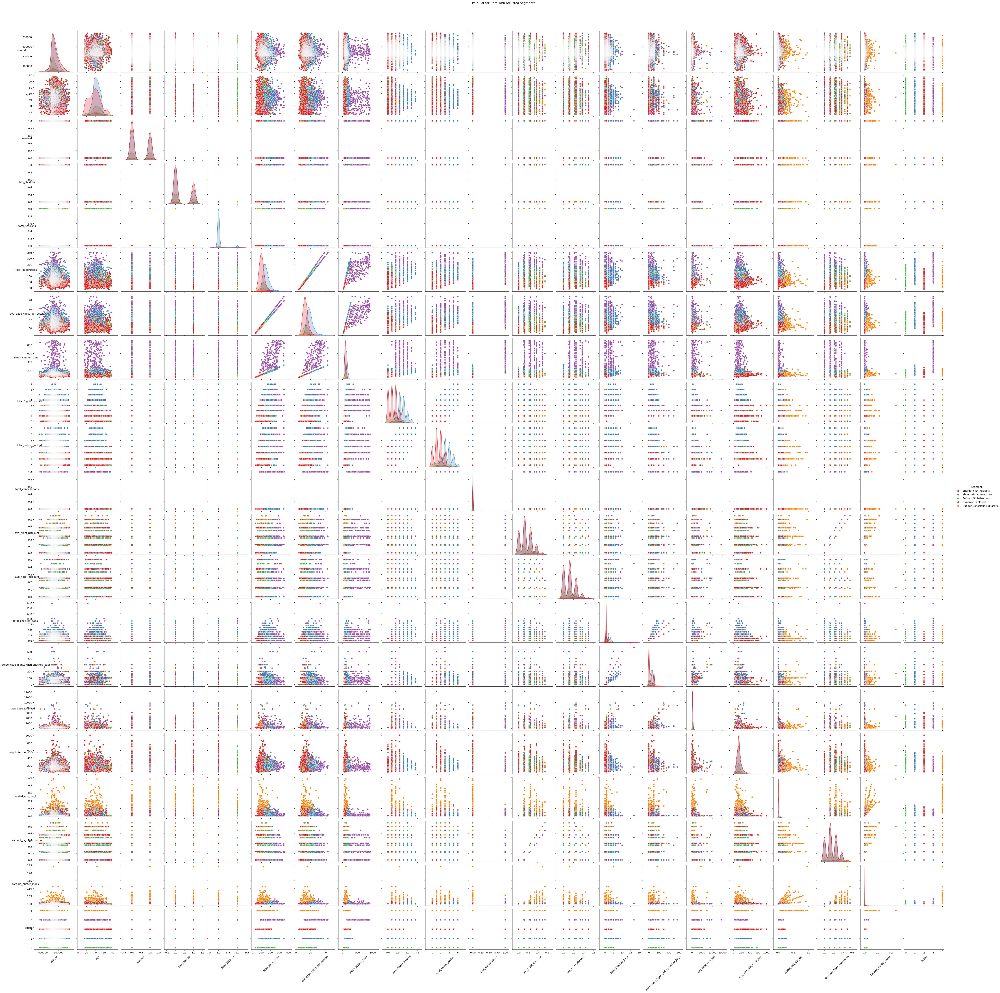

In [13]:
# Pair plot for 'data_no_outliers'
plt.figure(figsize=(15, 15))
pairplot_data_no_outliers = sns.pairplot(data_no_outliers, diag_kind='kde', hue='segment', palette='Set1')
pairplot_data_no_outliers.fig.suptitle('Pair Plot for Data with Adjusted Segments', y=1.02)
for ax in pairplot_data_no_outliers.axes.flat:
    ax.set_xlabel(ax.get_xlabel(), rotation=45)
    ax.set_ylabel(ax.get_ylabel(), rotation=0)
plt.show()

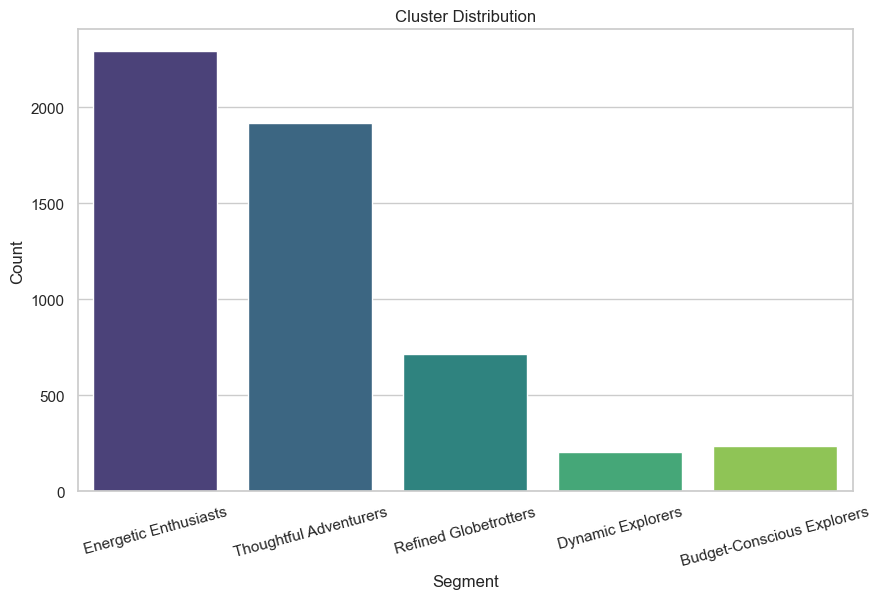

In [14]:
# Set the style for seaborn plots
sns.set(style="whitegrid")

# Visualize Cluster Distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='segment', data=data_no_outliers, palette='viridis')
plt.title('Cluster Distribution')
plt.xlabel('Segment')
plt.ylabel('Count')
plt.xticks(rotation=15)
plt.show()


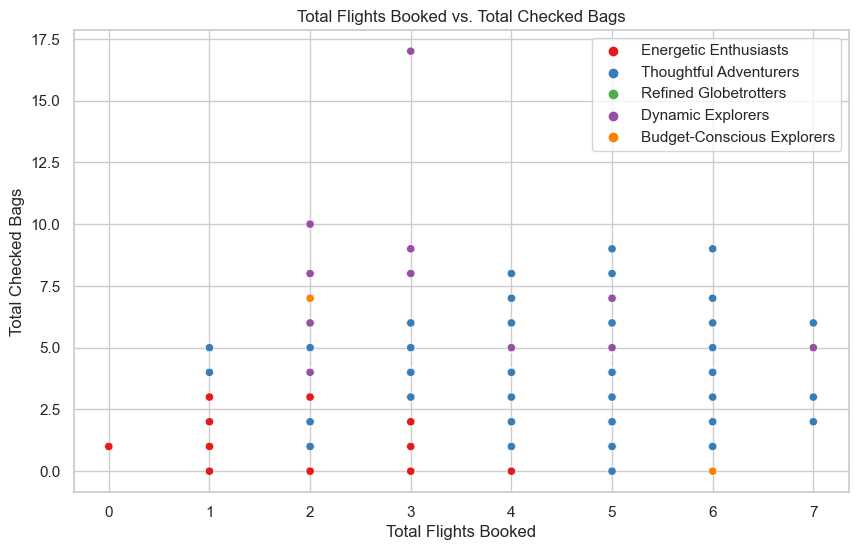

In [15]:
# Visualize Total Flights Booked vs. Total Checked Bags
plt.figure(figsize=(10, 6))
sns.scatterplot(x='total_flights_booked', y='total_checked_bags', hue='segment', data=data_no_outliers, palette='Set1')
plt.title('Total Flights Booked vs. Total Checked Bags')
plt.xlabel('Total Flights Booked')
plt.ylabel('Total Checked Bags')
plt.legend()
plt.show()


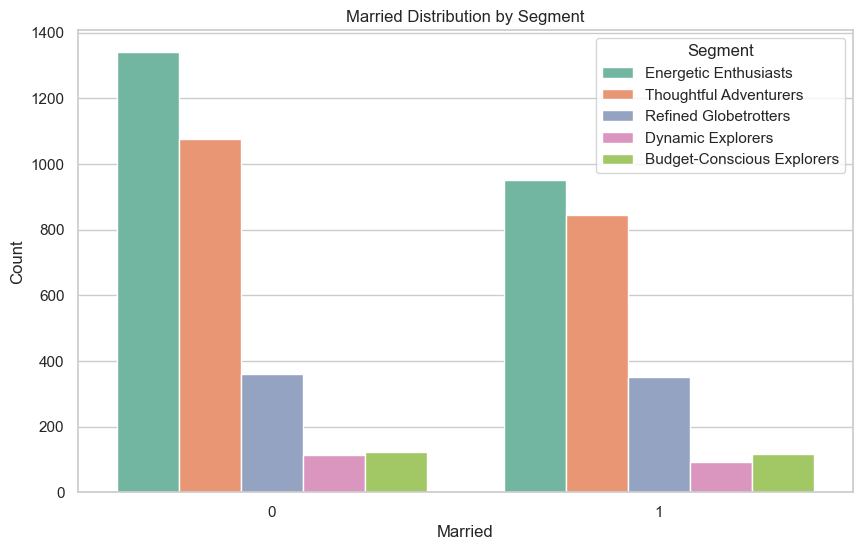

In [16]:
# Visualize Married Distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='married', hue='segment', data=data_no_outliers, palette='Set2')
plt.title('Married Distribution by Segment')
plt.xlabel('Married')
plt.ylabel('Count')
plt.legend(title='Segment')
plt.show()


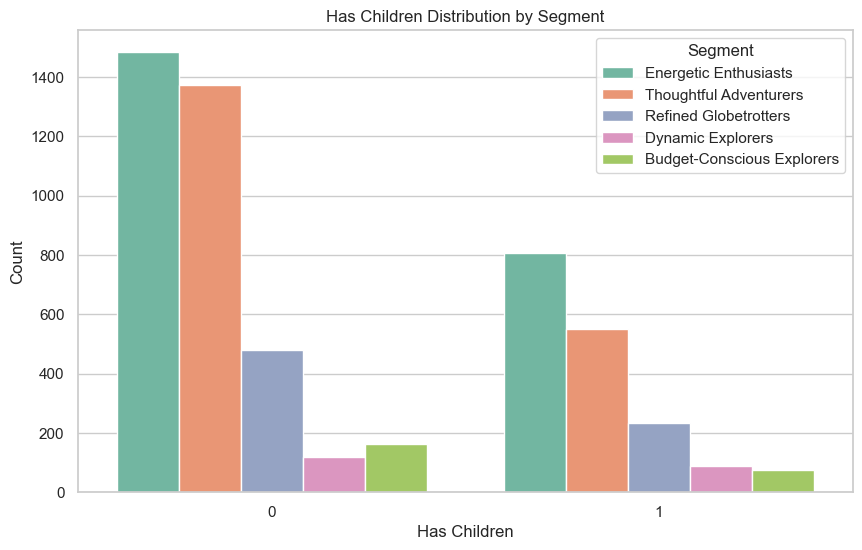

In [17]:
# Visualize Has Children Distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='has_children', hue='segment', data=data_no_outliers, palette='Set2')
plt.title('Has Children Distribution by Segment')
plt.xlabel('Has Children')
plt.ylabel('Count')
plt.legend(title='Segment')
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


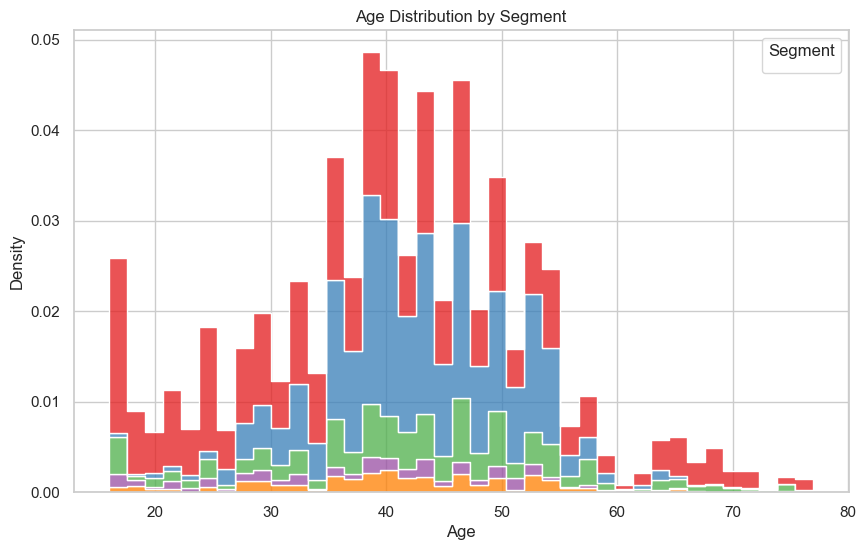

In [18]:
# Visualize Age Distribution
plt.figure(figsize=(10, 6))
sns.histplot(data=data_no_outliers, x='age', hue='segment', multiple='stack', palette='Set1', element='step', stat='density')
plt.title('Age Distribution by Segment')
plt.xlabel('Age')
plt.ylabel('Density')
plt.legend(title='Segment')
plt.show()


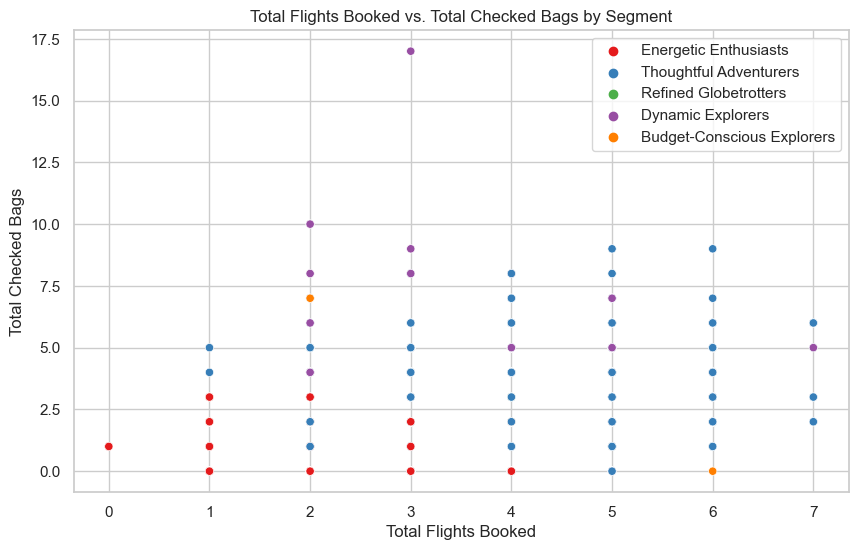

In [19]:

# Scatter Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='total_flights_booked', y='total_checked_bags', hue='segment', data=data_no_outliers, palette='Set1')
plt.title('Total Flights Booked vs. Total Checked Bags by Segment')
plt.xlabel('Total Flights Booked')
plt.ylabel('Total Checked Bags')
plt.legend()
plt.show()


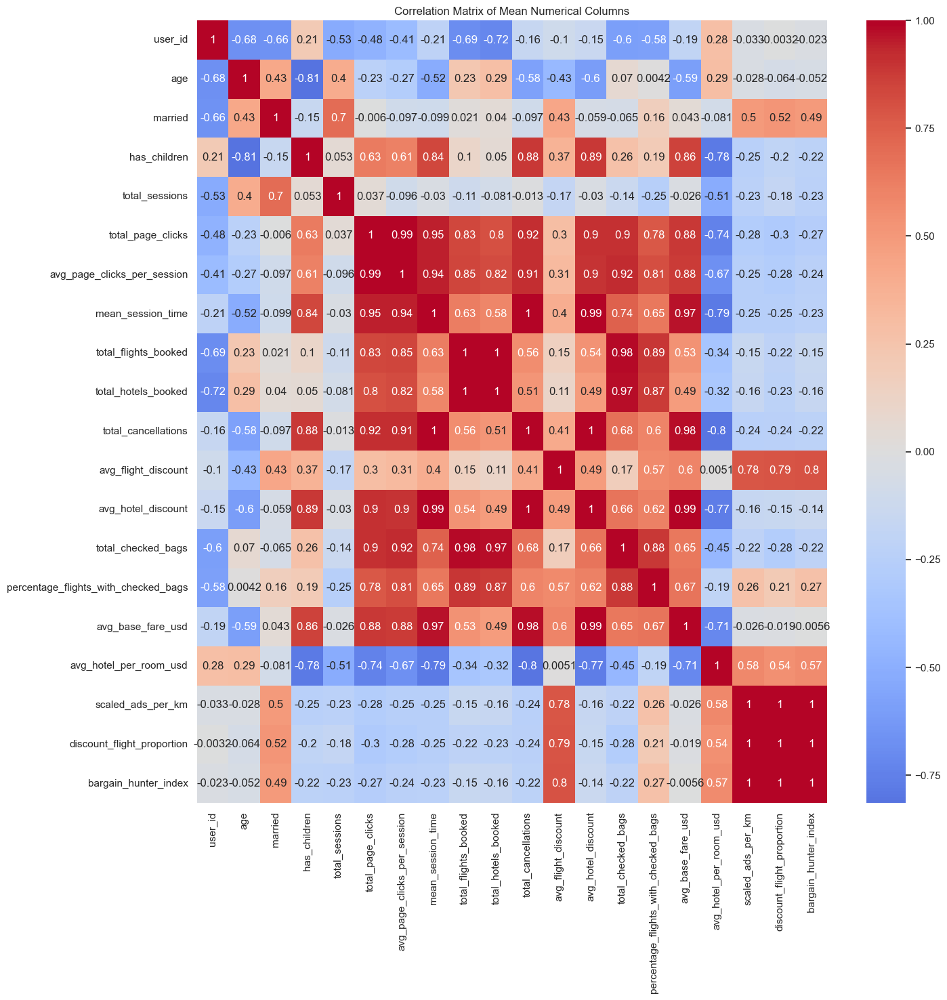

In [20]:
# Select numerical columns by data type
numerical_columns = data_no_outliers.select_dtypes(include=['int64', 'float64']).columns

# Calculate the means of numerical columns by segment
mean_numerical_columns = data_no_outliers.groupby('segment')[numerical_columns].mean()

# Calculate the correlation matrix for the mean numerical columns
correlation_matrix = mean_numerical_columns.corr()

# Plot the correlation matrix heatmap
plt.figure(figsize=(15, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix of Mean Numerical Columns')
plt.show()

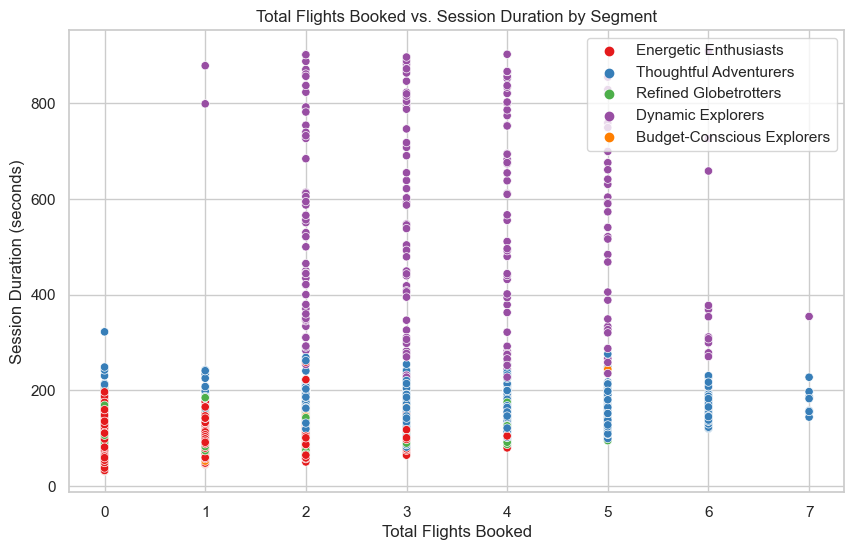

In [21]:


# Individual Scatter Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='total_flights_booked', y='mean_session_time', hue='segment', data=data_no_outliers, palette='Set1')
plt.title('Total Flights Booked vs. Session Duration by Segment')
plt.xlabel('Total Flights Booked')
plt.ylabel('Session Duration (seconds)')
plt.legend()
plt.show()


In [22]:
output_path = r"C:\Users\ashka\OneDrive\Documents\DA 205 Segmentation\New folder\data_no_outliers.xlsx"

# Export the DataFrame to Excel
data_no_outliers.to_excel(output_path, index=False)

In [24]:
data_no_outliers.groupby('segment')['total_cancellations'].sum()

segment
Budget-Conscious Explorers      1
Dynamic Explorers             206
Energetic Enthusiasts           6
Refined Globetrotters           1
Thoughtful Adventurers          2
Name: total_cancellations, dtype: int64

In [26]:
data_no_outliers.groupby('segment')['user_id'].count()

segment
Budget-Conscious Explorers     237
Dynamic Explorers              206
Energetic Enthusiasts         2291
Refined Globetrotters          713
Thoughtful Adventurers        1920
Name: user_id, dtype: int64

In [27]:
# Create a DataFrame for Dynamic Explorers segment
dynamic_explorers_data = data_no_outliers[data_no_outliers['segment'] == 'Dynamic Explorers']

# Group by user_id and calculate the sum of cancellations for each user
user_cancellations = dynamic_explorers_data.groupby('user_id')['total_cancellations'].sum()

# Display the result
print(user_cancellations)

user_id
363535    1
381465    1
407118    1
413658    1
423042    1
426478    1
429375    1
431899    1
438985    1
452612    1
454934    1
460625    1
466723    1
467892    1
468832    1
469440    1
473402    1
474239    1
479524    1
482548    1
484342    1
485891    1
486447    1
487680    1
488480    1
495029    1
496899    1
503342    1
505617    1
505933    1
507732    1
508912    1
509421    1
509645    1
510108    1
510343    1
510558    1
511552    1
511784    1
512103    1
512377    1
514953    1
515085    1
515229    1
516132    1
516211    1
516283    1
516287    1
516301    1
516679    1
516806    1
517356    1
517772    1
517898    1
518629    1
518756    1
519709    1
519718    1
519787    1
520539    1
520947    1
521335    1
521818    1
522111    1
522152    1
522420    1
523299    1
524358    1
524980    1
525332    1
525555    1
525610    1
526570    1
526727    1
527158    1
527782    1
528743    1
529704    1
530514    1
530720    1
531339    1
531427    1
531745  